In [0]:
# File location and type
file_location = "/FileStore/tables/athlete_events_1-8.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
1,A Dijiang,M,24,180,80,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NA
2,A Lamusi,M,23,170,60,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NA
3,Gunnar Nielsen Aaby,M,24,NA,NA,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NA
4,Edgar Lindenau Aabye,M,34,NA,NA,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
5,Christine Jacoba Aaftink,F,21,185,82,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NA
5,Christine Jacoba Aaftink,F,21,185,82,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 1,000 metres
5,Christine Jacoba Aaftink,F,25,185,82,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,NA
5,Christine Jacoba Aaftink,F,25,185,82,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 1,000 metres
5,Christine Jacoba Aaftink,F,27,185,82,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,NA
5,Christine Jacoba Aaftink,F,27,185,82,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 1,000 metres


In [0]:
from pyspark.sql.functions import col

# Contar a quantidade de valores nulos na coluna "Weight"
qtd_nulos_weight = df.filter(col("Weight").isNull()).count()

print(f"Quantidade de valores nulos na coluna 'Weight': {qtd_nulos_weight}")

#Ao observar que os dados não estão nulos e estão como NA

# Conta os valores nulos ou "NA" na coluna "Weight"
qtd_nulos_na = df.filter((col("Weight").isNull()) | (col("Weight") == "NA")).count()

# Exibe o resultado
print(f"Quantidade de valores nulos ou 'NA' na coluna 'Weight': {qtd_nulos_na}")

Quantidade de valores nulos na coluna 'Weight': 0
Quantidade de valores nulos ou 'NA' na coluna 'Weight': 62743


In [0]:
#Criando uma visualização temporária
df.createOrReplaceTempView('athlete_events_view')

In [0]:

%sql
SELECT
  -- Conta a quantidade de registros com o valor NULL na coluna 'Age'
  COUNT(CASE WHEN Age IS NULL OR Age = 'NA' THEN 1 END) AS registros_nulos_ou_NA,
  
  -- Conta o total de registros na tabela 'athlete_events_5_csv'
  COUNT(*) AS total_registros

-- Define a tabela em que a consulta será realizada
FROM athlete_events_view;

registros_nulos_ou_NA,total_registros
9441,271116


In [0]:
%sql
SELECT DISTINCT Year, 
       COUNT(CASE WHEN Age IS NULL OR Age = 'NA' THEN 1 END) AS registros_nulos_Age,  -- Contar os registros com valores nulos ou "NA" na coluna Age
       COUNT(CASE WHEN Weight IS NULL OR Weight = 'NA' THEN 1 END) AS registros_nulos_Weight  -- Contar os registros com valores nulos ou "NA" na coluna Weight
FROM athlete_events_view  -- Na tabela temporária criada para consultar os dados
WHERE Age IS NULL OR Age = 'NA'  -- Filtrar as linhas onde a coluna Age é nula ou contém "NA"
   OR Weight IS NULL OR Weight = 'NA'  -- Filtrar as linhas onde a coluna Weight é nula ou contém "NA"
GROUP BY Year  -- Agrupar os resultados por ano, para contar os nulos por ano
ORDER BY Year;  -- Ordenar os resultados em ordem crescente de ano

Year,registros_nulos_Age,registros_nulos_Weight
1896,163,331
1900,785,1808
1900 Summer,2,45
1904,249,1031
1904 Summer,23,117
1906,726,1502
1906 Summer,17,26
1908,646,2595
1908 Summer,0,23
1912,156,3397


In [0]:
%sql
SELECT 
    MIN(CAST(Year AS INT)) AS Ano_Minimo,  -- Obtém o menor ano da base, convertendo a coluna Year para INT
    MAX(CAST(Year AS INT)) AS Ano_Maximo   -- Obtém o maior ano da base, convertendo a coluna Year para INT
FROM athlete_events_view;  -- Nome da tabela ou view usada na consulta

Ano_Minimo,Ano_Maximo
1896,2016


In [0]:
%sql
-- Criando uma nova tabela temporária contendo apenas os anos de interesse
CREATE OR REPLACE TEMP VIEW athlete_events_filtered AS
SELECT * 
FROM athlete_events_view  -- Usando a tabela temporária original
WHERE CAST(Year AS INT) BETWEEN 2010 AND 2016;  -- Filtrando os anos desejados

In [0]:
%sql
-- Exibir os dados filtrados
SELECT * FROM athlete_events_filtered
LIMIT 100;  -- Mostrar apenas as 100 primeiras linhas

ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
2,A Lamusi,M,23,170,60,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NA
16,Juhamatti Tapio Aaltonen,M,28,184,85,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze
22,Andreea Aanei,F,22,170,125,Romania,ROU,2016 Summer,2016,Summer,Rio de Janeiro,Weightlifting,Weightlifting Women's Super-Heavyweight,NA
34,Jamale (Djamel-) Aarrass (Ahrass-),M,30,187,76,France,FRA,2012 Summer,2012,Summer,London,Athletics,Athletics Men's 1,500 metres
48,Abdelhak Aatakni,M,24,NA,64,Morocco,MAR,2012 Summer,2012,Summer,London,Boxing,Boxing Men's Light-Welterweight,NA
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Individual All-Around,NA
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Floor Exercise,NA
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Parallel Bars,NA
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Horizontal Bar,NA
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Rings,NA


In [0]:
# Ler o arquivo Parquet
df_noc = spark.read.parquet("/dbfs/tmp/noc_regions9.parquet")
df_noc.createOrReplaceTempView("noc_regions9")

In [0]:
%sql
-- Utilizando SQL para fazer a junção entre as tabelas
SELECT a.*, b.* -- Selecionar todas as colunas das tabelas a e b (athelete_events_filtered e noc_regions9)
FROM athlete_events_filtered a
JOIN noc_regions9 b
ON a.NOC = b.NOC; -- Considerar a tabela NOC

ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,NOC,region,notes
2,A Lamusi,M,23,170,60,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NA,CHN,China,null
16,Juhamatti Tapio Aaltonen,M,28,184,85,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,FIN,Finland,null
22,Andreea Aanei,F,22,170,125,Romania,ROU,2016 Summer,2016,Summer,Rio de Janeiro,Weightlifting,Weightlifting Women's Super-Heavyweight,NA,ROU,Romania,null
34,Jamale (Djamel-) Aarrass (Ahrass-),M,30,187,76,France,FRA,2012 Summer,2012,Summer,London,Athletics,Athletics Men's 1,500 metres,FRA,France,null
48,Abdelhak Aatakni,M,24,NA,64,Morocco,MAR,2012 Summer,2012,Summer,London,Boxing,Boxing Men's Light-Welterweight,NA,MAR,Morocco,null
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Individual All-Around,NA,ESP,Spain,null
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Floor Exercise,NA,ESP,Spain,null
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Parallel Bars,NA,ESP,Spain,null
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Horizontal Bar,NA,ESP,Spain,null
51,Nstor Abad Sanjun,M,23,167,64,Spain,ESP,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Rings,NA,ESP,Spain,null


In [0]:
%sql
SELECT Name, Weight, Sport, Year, NOC  
FROM athlete_events_filtered  
WHERE Weight IS NOT NULL  -- Remove valores nulos  
  AND Weight <> 'NA'  -- Remove registros com "NA"  
ORDER BY CAST(Weight AS FLOAT) DESC  -- Ordena pelo peso do maior para o menor  
LIMIT 10;  -- Retorna apenas os 10 primeiros registros

Name,Weight,Sport,Year,NOC
Janusz Wojnarowicz,170,Judo,2012,POL
Illie Daniel Natea,170,Judo,2016,ROU
Ion Emilianov,165,Athletics,2016,MDA
Carl Andrew Myerscough,160,Athletics,2012,GBR
Behdad Salimi Kordasiabi,160,Weightlifting,2012,IRI
Pter Nagy,160,Weightlifting,2012,HUN
Rafael Carlos da Silva,160,Judo,2012,BRA
Pter Nagy,160,Weightlifting,2016,HUN
Lasha Talakhadze,160,Weightlifting,2016,GEO
Rafael Carlos da Silva,160,Judo,2016,BRA


In [0]:
%sql
-- Seleciona a idade do atleta, o tipo de medalha e a contagem de medalhas
SELECT Age, Medal, COUNT(*) AS Total_Medalhas
FROM athlete_events_filtered
WHERE Age IS NOT NULL  -- Filtrar registros onde a idade não é nula
  AND Age <> 'NA'  -- Remover registros onde a idade contém "NA"
  AND Medal IN ('Gold', 'Silver', 'Bronze')  -- Considerar apenas medalhas válidas (ouro, prata e bronze)
GROUP BY Age, Medal  -- Agrupar os resultados por idade e tipo de medalha
ORDER BY Total_Medalhas DESC;  -- Ordenar os resultados pela idade de forma crescente

Age,Medal,Total_Medalhas
25,Silver,144
24,Gold,135
27,Gold,125
25,Bronze,125
24,Silver,121
26,Gold,117
26,Bronze,117
23,Gold,116
27,Silver,115
27,Bronze,115


In [0]:
%sql
-- Seleciona a idade e a contagem de atletas distintos
SELECT Age, COUNT(DISTINCT Name) AS Total_Atletas
FROM athlete_events_filtered
WHERE Age IS NOT NULL  -- Filtrar registros onde a idade não é nula
  AND Age <> 'NA'  -- Remover registros onde a idade contém "NA"
GROUP BY Age  -- Agrupar os resultados por idade
ORDER BY Total_Atletas DESC;  -- Ordenar pela idade em ordem crescente


Age,Total_Atletas
25,2207
24,2185
23,2159
26,2041
27,2019
22,1986
28,1740
21,1604
29,1566
30,1284


In [0]:
%sql
-- Analisar o peso médio dos atletas por ano e por esporte
SELECT 
  Year,                          -- Ano da edição olímpica
  Sport,                         -- Modalidade esportiva
  COUNT(*) AS Total_Atletas,    -- Total de atletas registrados naquela combinação de ano e esporte
  AVG(CAST(Weight AS FLOAT)) AS Peso_Medio  -- Peso médio dos atletas (convertido para float)
FROM athlete_events_filtered
WHERE Weight IS NOT NULL        -- Excluir valores nulos
  AND Weight <> 'NA'            -- Excluir registros com "NA"
GROUP BY Year, Sport            -- Agrupar por ano e esporte
ORDER BY Year, Peso_Medio DESC; -- Ordenar por ano e maior peso médio


Year,Sport,Total_Atletas,Peso_Medio
2010,Bobsleigh,199,92.92713567839196
2010,Ice Hockey,417,81.00599520383693
2010,Luge,107,79.51401869158879
2010,Alpine Skiing,681,75.33480176211454
2010,Skeleton,47,72.8936170212766
2010,Curling,89,71.79775280898876
2010,Speed Skating,364,71.37362637362638
2010,Snowboarding,180,70.1
2010,Freestyle Skiing,169,69.26331360946746
2010,Cross Country Skiing,713,65.70827489481066


In [0]:
%sql
-- Verificar a altura média dos atletas por esporte
SELECT 
  Sport,                               -- Modalidade esportiva
  COUNT(*) AS Total_Atletas,          -- Número total de registros por esporte
  AVG(CAST(Height AS FLOAT)) AS Altura_Media  -- Altura média dos atletas no esporte (convertida para float)
FROM athlete_events_filtered
WHERE Height IS NOT NULL              -- Exclui registros nulos
  AND Height <> 'NA'                  -- Exclui registros com "NA"
GROUP BY Sport                         -- Agrupamento por esporte
ORDER BY Altura_Media DESC;           -- Ordena do mais alto para o mais baixo


Sport,Total_Atletas,Altura_Media
Basketball,561,192.06595365418895
Volleyball,570,190.1280701754386
Beach Volleyball,192,187.15625
Water Polo,515,185.68543689320387
Rowing,1094,185.28519195612432
Handball,698,183.76647564469914
Bobsleigh,421,182.82422802850357
Swimming,3035,180.54530477759474
Tennis,569,180.1476274165202
Ice Hockey,859,178.988358556461


In [0]:
%sql
-- Calcular a altura média apenas dos atletas que ganharam medalha de ouro
SELECT 
  Sport,                                 -- Modalidade esportiva
  COUNT(*) AS Medalhistas_Ouro,         -- Número de medalhistas de ouro no esporte
  AVG(CAST(Height AS FLOAT)) AS Altura_Media_Ouro  -- Altura média dos medalhistas de ouro
FROM athlete_events_filtered
WHERE Medal = 'Gold'                    -- Apenas medalhas de ouro
  AND Height IS NOT NULL                -- Excluir registros nulos
  AND Height <> 'NA'                    -- Excluir registros com "NA"
GROUP BY Sport                           -- Agrupar por esporte
ORDER BY Altura_Media_Ouro DESC;        -- Ordenar do mais alto para o mais baixo


Sport,Medalhistas_Ouro,Altura_Media_Ouro
Basketball,44,192.9318181818182
Volleyball,48,192.89583333333334
Water Polo,51,188.3921568627451
Beach Volleyball,8,188.25
Rowing,96,186.57291666666666
Bobsleigh,16,185.25
Swimming,129,185.05426356589146
Handball,58,184.5
Luge,12,183.25
Tennis,16,182.6875


In [0]:
%sql
-- Verificar em quantas edições dos Jogos cada esporte apareceu
SELECT 
  Sport,                                 -- Modalidade esportiva
  COUNT(DISTINCT Year) AS Total_Edicoes  -- Número de edições olímpicas em que o esporte esteve presente
FROM athlete_events_filtered
GROUP BY Sport                           -- Agrupamos por esporte
ORDER BY Total_Edicoes DESC;            -- Ordenamos do que mais apareceu para o que menos apareceu


Sport,Total_Edicoes
Gymnastics,2
Tennis,2
Boxing,2
Ice Hockey,2
Rowing,2
Judo,2
Sailing,2
Swimming,2
Alpine Skiing,2
Basketball,2


 Análise 1: Top 10 Atletas Mais Pesados
<Figure size 1296x432 with 0 Axes>

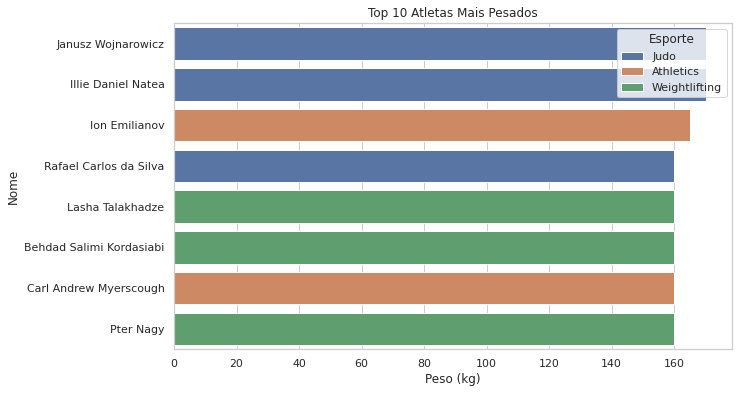

 Análise 2: Relação entre Idade e Quantidade de Medalhas


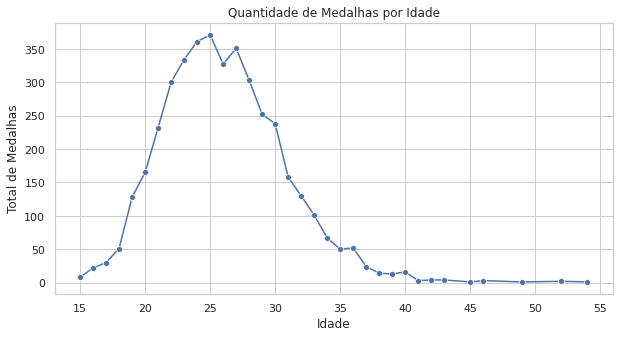

 Análise 3: Distribuição da Idade dos Atletas


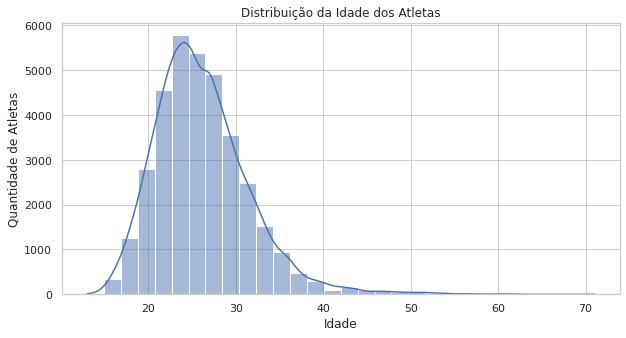

 Análise 4: Relação entre Altura e Esporte


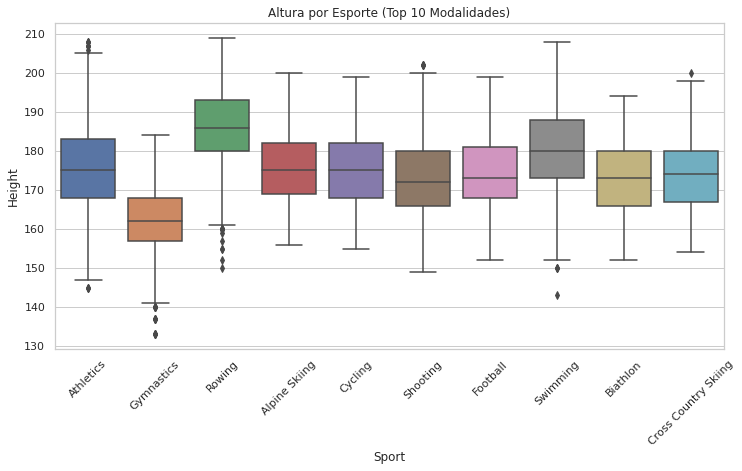

 Análise 5: Peso Médio por Ano


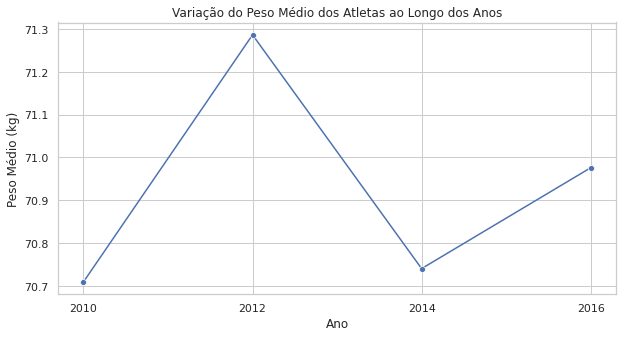

 Esportes com Maior Peso Médio


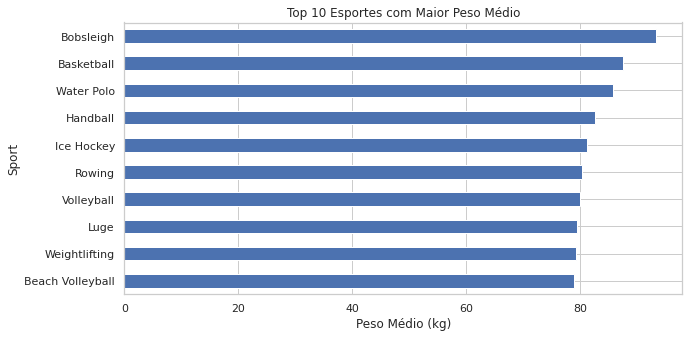

 Análise 6: Altura Média dos Medalhistas de Ouro


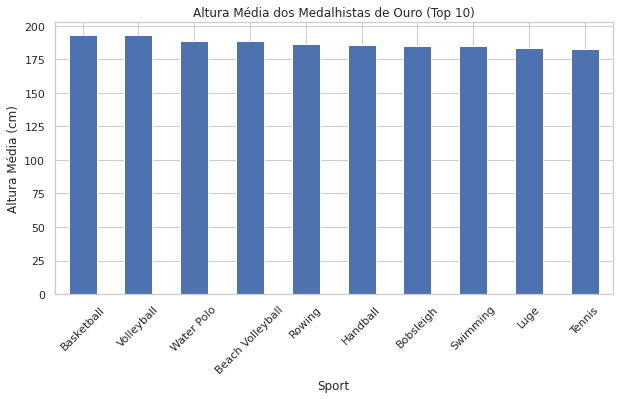

 Análise 7: Esporte x Quantidade de Jogos (edições)


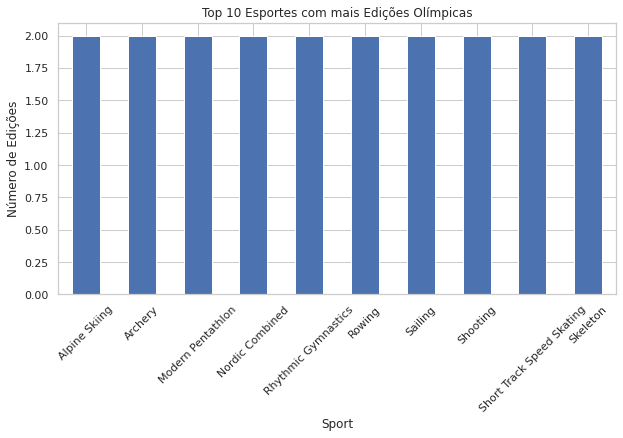

 Análise 8: Atletas Brasileiros com Mais Jogos


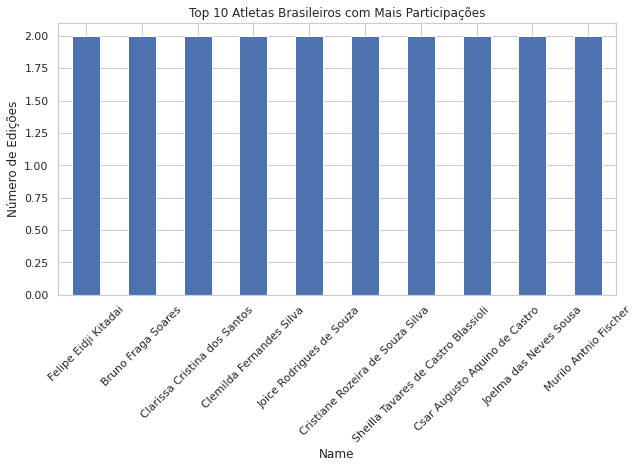

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações visuais
sns.set(style="whitegrid")
plt.figure(figsize=(18, 6))

# Carregar os dados tratados como Pandas
df_athletes = spark.sql("""
    SELECT *
    FROM athlete_events_filtered
    WHERE Weight IS NOT NULL AND Weight != 'NA'
      AND Age IS NOT NULL AND Age != 'NA'
      AND Height IS NOT NULL AND Height != 'NA'
""").toPandas()

# Conversões
df_athletes["Weight"] = df_athletes["Weight"].astype(float)
df_athletes["Age"] = df_athletes["Age"].astype(int)
df_athletes["Height"] = df_athletes["Height"].astype(float)

###  Análise 1: Atletas mais pesados
print(" Análise 1: Top 10 Atletas Mais Pesados")
top_pesados = df_athletes.sort_values(by="Weight", ascending=False).head(10)
plt.figure(figsize=(10,6))
sns.barplot(x="Weight", y="Name", data=top_pesados, hue="Sport", dodge=False)
plt.title("Top 10 Atletas Mais Pesados")
plt.xlabel("Peso (kg)")
plt.ylabel("Nome")
plt.legend(title="Esporte")
plt.show()

###  Análise 2: Idade x Medalhas
print(" Análise 2: Relação entre Idade e Quantidade de Medalhas")
medalhas = df_athletes[df_athletes["Medal"].isin(["Gold", "Silver", "Bronze"])]
idade_medalhas = medalhas.groupby("Age")["Medal"].count().reset_index(name="Total_Medalhas")
plt.figure(figsize=(10,5))
sns.lineplot(x="Age", y="Total_Medalhas", data=idade_medalhas, marker="o")
plt.title("Quantidade de Medalhas por Idade")
plt.xlabel("Idade")
plt.ylabel("Total de Medalhas")
plt.show()

###  Análise 3: Distribuição da Idade dos Atletas
print(" Análise 3: Distribuição da Idade dos Atletas")
plt.figure(figsize=(10,5))
sns.histplot(df_athletes["Age"], bins=30, kde=True)
plt.title("Distribuição da Idade dos Atletas")
plt.xlabel("Idade")
plt.ylabel("Quantidade de Atletas")
plt.show()

###  Análise 4: Altura x Tipo de Esporte
print(" Análise 4: Relação entre Altura e Esporte")
top_sports = df_athletes["Sport"].value_counts().head(10).index
altura_esportes = df_athletes[df_athletes["Sport"].isin(top_sports)]
plt.figure(figsize=(12,6))
sns.boxplot(data=altura_esportes, x="Sport", y="Height")
plt.xticks(rotation=45)
plt.title("Altura por Esporte (Top 10 Modalidades)")
plt.show()

###  Análise 5: Peso Médio por Ano e Esporte com Maior Peso Médio
print(" Análise 5: Peso Médio por Ano")
peso_ano = df_athletes.groupby("Year")["Weight"].mean().reset_index()
plt.figure(figsize=(10,5))
sns.lineplot(x="Year", y="Weight", data=peso_ano, marker="o")
plt.title("Variação do Peso Médio dos Atletas ao Longo dos Anos")
plt.xlabel("Ano")
plt.ylabel("Peso Médio (kg)")
plt.show()

print(" Esportes com Maior Peso Médio")
peso_sport = df_athletes.groupby("Sport")["Weight"].mean().sort_values(ascending=False).head(10)
peso_sport.plot(kind='barh', figsize=(10,5), title="Top 10 Esportes com Maior Peso Médio")
plt.xlabel("Peso Médio (kg)")
plt.gca().invert_yaxis()
plt.show()

###  Análise 6: Altura Média dos Medalhistas de Ouro por Esporte
print(" Análise 6: Altura Média dos Medalhistas de Ouro")
ouro = df_athletes[df_athletes["Medal"] == "Gold"]
altura_media_ouro = ouro.groupby("Sport")["Height"].mean().sort_values(ascending=False).head(10)
altura_media_ouro.plot(kind="bar", figsize=(10,5), title="Altura Média dos Medalhistas de Ouro (Top 10)")
plt.ylabel("Altura Média (cm)")
plt.xticks(rotation=45)
plt.show()

###  Análise 7: Esportes com mais edições
print(" Análise 7: Esporte x Quantidade de Jogos (edições)")
esporte_jogos = df_athletes.groupby("Sport")["Year"].nunique().sort_values(ascending=False).head(10)
esporte_jogos.plot(kind="bar", figsize=(10,5), title="Top 10 Esportes com mais Edições Olímpicas")
plt.ylabel("Número de Edições")
plt.xticks(rotation=45)
plt.show()

###  Análise 8: Atletas Brasileiros com Mais Participações
print(" Análise 8: Atletas Brasileiros com Mais Jogos")
brasil = df_athletes[df_athletes["NOC"] == "BRA"]
participacoes = brasil.groupby("Name")["Year"].nunique().sort_values(ascending=False).head(10)
participacoes.plot(kind="bar", figsize=(10,5), title="Top 10 Atletas Brasileiros com Mais Participações")
plt.ylabel("Número de Edições")
plt.xticks(rotation=45)
plt.show()
